## Introduction

Washington, D.C., USA is a hotbed for young professionals getting their start in government- and politics-related fields. In fact, I am one of them! I would like to create a guide of best neighborhoods for young professionals in the District of Columbia. Hopefully, this will help young professionals who are new to the area get a better idea of where they would like to live.

Resources like [Niche](https://www.niche.com/about/methodology/best-places-for-young-professionals/) and [Zumper](https://www.zumper.com/blog/denvers-hottest-neighborhoods-for-young-professionals/) indicate that young professionals enjoy areas that are walkable and bikeable, accessible by public transportation, and have lots of restaurants, bars, and cafes. Now, we just have to figure out where those places are!

## Data

So, how can we attack this problem with data? We'll use two major data sources.

1. [Foursquare API](https://developer.foursquare.com/docs/build-with-foursquare/categories/)
    The Foursquare API will allow us to pull the "venues" available in a zip code-- including food establishments, locations for enjoying nightlife (e.g. bars and breweries), and art galleries, museums, and public art installations.
2. [Walk Score](https://www.walkscore.com/)
    Scraping the Walk Score website will enable us to pull Walk Scores, Bike Scores, and Transit Scores for all of our neighborhoods so that we can compare how easy it is to walk, bike, and take public transit there.

With these data sources, we will consider neighborhoods in the District of Columbia to figure out which areas young professionals are most likely to enjoy. We harvested the baseline data for neighborhoods in the District from its open data portal ([DC Open Data Portal](https://opendata.dc.gov/)).

In [1]:
# import the required packages and settings
import requests
import pandas as pd
import geopandas as gpd
import json
import folium
from bs4 import BeautifulSoup
from folium import plugins
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import numpy

pd.options.display.max_rows = 4000

In [2]:
# set parameters to collect the data from the Foursquare API
catid = '4d4b7105d754a06374d81259'
# this is the overarching category for food establishments (e.g, restaurants, cafes)
CLIENT_ID = '1GLTKXB0MOH5CRI3P5NU3LQXUOIHVP32KDVNMPG42P1PFPOZ' # your Foursquare ID
CLIENT_SECRET = '0J2PQT2LG1ONL4GR2VZLMSVSGD4YD313K2EM0MCQUGHSA5TS' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version'
dc_zips = ["20001","20002","20003","20004","20005","20006",
           "20007","20008","20009","20010","20011","20012","20015","20016","20017","20018","20019",
           "20020","20024","20026","20032","20036","20037","20045","20260","20374","20376","20388",
           "20391","20398","20500"] # these are the dc zip codes

In [3]:
venues_list = []
for zipi in dc_zips: # querying foursquare venues for each zip code
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&near={}&categoryId={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION, 
        zipi,
        catid)
        # make the GET request
    results = requests.get(url).json()["response"]['groups'][0]['items']
    # return only relevant information for each nearby venue
    venues_list.append([(
        v['venue']['name'], 
        v['venue']['location']['lat'], 
        v['venue']['location']['lng'],  
        v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Venue', 
                  'Latitude', 
                  'Longitude', 
                  'Venue Category']

In [4]:
nearby_venues1 = gpd.GeoDataFrame(nearby_venues, geometry = gpd.points_from_xy(nearby_venues["Latitude"],                                          
                                  nearby_venues["Longitude"]), 
                                  crs={'init': 'epsg:4326'}) # turn the nearby venues dataframe into a geodataframe
print(nearby_venues1.shape)
nearby_venues1.head() # check for size and overall look of the data

(914, 5)


,Venue,Latitude,Longitude,Venue Category,geometry
0,A Baked Joint,38.902280,-77.017215,Café,POINT (38.90228 -77.01722)
1,DC Empanadas,38.892529,-77.018992,Food Truck,POINT (38.89253 -77.01899)
2,The Capital Burger,38.903107,-77.021751,Burger Joint,POINT (38.90311 -77.02175)
3,The Dabney,38.906297,-77.024419,American Restaurant,POINT (38.90630 -77.02442)
4,The Red Hen,38.914989,-77.012368,Italian Restaurant,POINT (38.91499 -77.01237)


In [5]:
urlneighs = "https://opendata.arcgis.com/datasets/f6c703ebe2534fc3800609a07bad8f5b_17.geojson" #geojson for dc neighs
gdf = gpd.read_file(urlneighs, crs={'init': 'epsg:4326'}) #bring it into a geodataframe
gdf=gdf.rename(columns={"NBH_NAMES":"NEIGHBORHOOD"}) # rename name column
gdf=gdf.drop(columns=["WEB_URL",'NAME']) # clean up the columns

In [6]:
# completed spatial join of the gdf and nearby_venues in qgis by using spatial intersect
connected_data = pd.read_csv("Arl_DC_Ven_SJOIN.csv")
ok =connected_data.groupby("NEIGHBORHO").count()[['Venue']]
gdf = pd.merge(gdf, ok, how='inner',left_on="NEIGHBORHOOD",right_on="NEIGHBORHO")
gdf = gdf.sort_values(by="Venue", ascending=False)
gdf.head(10)

,OBJECTID,NEIGHBORHOOD,Shape_Length,Shape_Area,TYPE,geometry,Venue
4,6,"Downtown, Chinatown, Penn Quarters, Mount Vern...",7343.048621,2.937442e+06,Original,"POLYGON ((-77.00906 38.90566, -77.00904 38.907...",191
2,4,"Near Southeast, Navy Yard",7286.968902,1.619167e+06,Original,"POLYGON ((-76.98726 38.87712, -76.98860 38.877...",69
11,14,"Dupont Circle, Connecticut Avenue/K Street",6838.303702,2.286330e+06,Original,"POLYGON ((-77.03455 38.91270, -77.03455 38.913...",69
10,13,"Georgetown, Burleith/Hillandale",8517.966404,3.381462e+06,Original,"POLYGON ((-77.06518 38.91684, -77.06527 38.917...",41
34,39,"Capitol Hill, Lincoln Park",9590.530313,4.503507e+06,Original,"POLYGON ((-76.99496 38.89203, -76.99568 38.892...",39
30,35,"Brookland, Brentwood, Langdon",9641.417127,4.813915e+06,Original,"POLYGON ((-76.97292 38.93259, -76.97341 38.933...",34
29,34,"Columbia Heights, Mt. Pleasant, Pleasant Plain...",9153.209237,3.400110e+06,Original,"POLYGON ((-77.03523 38.93743, -77.03570 38.937...",28
9,12,"Ivy City, Arboretum, Trinidad, Carver Langston",10168.655829,3.516219e+06,Original,"POLYGON ((-76.96972 38.91740, -76.97013 38.917...",26
26,31,"Union Station, Stanton Park, Kingman Park",10380.967259,4.149923e+06,Original,"POLYGON ((-76.98440 38.90032, -76.98472 38.900...",24
19,22,"Friendship Heights, American University Park, ...",9023.803202,4.188961e+06,Original,"POLYGON ((-77.06893 38.94235, -77.06897 38.942...",24


In [7]:
url_score = "https://www.walkscore.com/DC/Washington_D.C."
scores = requests.get(url_score) # scrape the walkscore data for neighborhoods in dc from their website
text = scores.text
soup = BeautifulSoup(text, 'html.parser') # parse the text with beautifulsoup
table = soup.find_all('table') # find the table in the beautifulsoup-parsed html
score_df = pd.read_html(str(table))[0] # read the html table into a pandas dataframe

In [8]:
# spent time manually cleaning the names of the neighborhoods to match the names in the dc and arlington databases
scores_clean = pd.read_csv("clean_scores.csv")
gdf = pd.merge(gdf,scores_clean, how='inner',left_on='NEIGHBORHOOD',right_on="Name")
gdf=gdf[gdf['TYPE'] == "Original"]
gdf=gdf.sort_values("Venue",ascending=False)
gdf.head()

,OBJECTID,NEIGHBORHOOD,Shape_Length,Shape_Area,TYPE,geometry,Venue,Unnamed: 0,Name,Walk Score,Transit Score,Bike Score,Composite
0,6,"Downtown, Chinatown, Penn Quarters, Mount Vern...",7343.048621,2.937442e+06,Original,"POLYGON ((-77.00906 38.90566, -77.00904 38.907...",191,8,"Downtown, Chinatown, Penn Quarters, Mount Vern...",93,100,92,95.000000
2,14,"Dupont Circle, Connecticut Avenue/K Street",6838.303702,2.286330e+06,Original,"POLYGON ((-77.03455 38.91270, -77.03455 38.913...",69,1,"Dupont Circle, Connecticut Avenue/K Street",98,89,95,94.000000
1,4,"Near Southeast, Navy Yard",7286.968902,1.619167e+06,Original,"POLYGON ((-76.98726 38.87712, -76.98860 38.877...",69,11,"Near Southeast, Navy Yard",89,84,87,86.666667
3,13,"Georgetown, Burleith/Hillandale",8517.966404,3.381462e+06,Original,"POLYGON ((-77.06518 38.91684, -77.06527 38.917...",41,21,"Georgetown, Burleith/Hillandale",79,61,71,70.333333
4,39,"Capitol Hill, Lincoln Park",9590.530313,4.503507e+06,Original,"POLYGON ((-76.99496 38.89203, -76.99568 38.892...",39,14,"Capitol Hill, Lincoln Park",86,81,92,86.333333


## Methodology

Once I collected and cleaned all of the relevant data, I first created exploratory maps of the average Walk, Bike, and Transit Scores by neighborhood and the number of food venues by neighborhood. I created histograms of each of the datasets in order to understand how they were distributed (and, accordingly, statistical tests that might be appropriate to conduct). Note that neighborhoods with 0 venues identified in Foursquare were excluded from the analysis.

### Exploratory Data Analysis

In [9]:
m = folium.Map( # MAP OF NEIGHBORHOODS BY NUMBER OF FOOD AND DRINK VENUES
    location=[38.897957,-77.036560],
    zoom_start=12
)

folium.GeoJson(
    urlneighs,
    name='geojson'
).add_to(m)

folium.Choropleth(
    geo_data=gdf,
    name='choropleth',
    data=gdf,
    columns=['NEIGHBORHOOD', 'Venue'],
    key_on='feature.properties.NEIGHBORHOOD',
    fill_color='YlOrRd',
    nan_fill_color="lightgrey",
    nan_fill_opacity=.7,
    nan_line_opacity=.2,
    fill_opacity=0.7,
    line_opacity=0.2,
    bins=3,
    legend_name='Number of Venues'
).add_to(m)

# add markers to the map
for lat, lon, poi,cat in zip(nearby_venues['Latitude'], nearby_venues['Longitude'],nearby_venues['Venue'],nearby_venues['Venue Category']):
    label = folium.Popup(poi+" -"+ cat)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color = "lightblue",
        opacity=.2,
        fill=True,
        fill_color="blue",
        fill_opacity=0.2).add_to(m)
    
display(m)

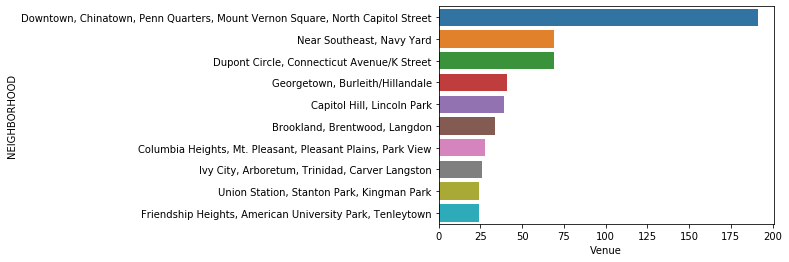

In [10]:
gdf=gdf.sort_values("Venue", ascending = False) # top 10 neighborhoods by number of food and drink venues
ax=sns.barplot("Venue","NEIGHBORHOOD",data=gdf.head(10))

In [11]:
m2 = folium.Map( # MAP OF NEIGHBORHOODS BY COMPOSITE WALK/BIKE/TRANSIT SCORES
    location=[38.897957,-77.036560],
    zoom_start=12
)

folium.GeoJson(
    urlneighs,
    name='geojson'
).add_to(m2)


folium.Choropleth(
    geo_data=gdf,
    name='choropleth',
    data=gdf,
    columns=['NEIGHBORHOOD', 'Composite'],
    key_on='feature.properties.NEIGHBORHOOD',
    fill_color='YlOrRd',
    nan_fill_color="lightgrey",
    nan_fill_opacity=.7,
    nan_line_opacity=.2,
    fill_opacity=0.7,
    line_opacity=0.2,
 #   bins=bins,
    legend_name='Composite Transit, Bike, and Walk Score'
).add_to(m2)

display(m2)

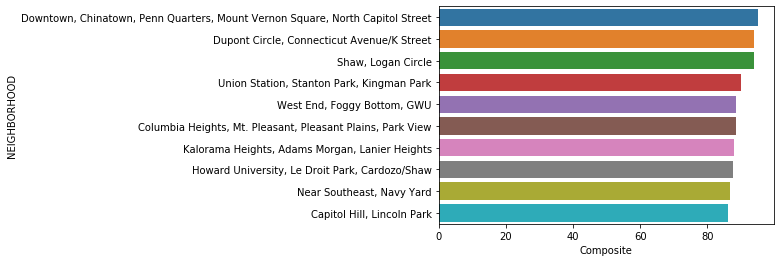

In [12]:
gdf=gdf.sort_values("Composite", ascending = False) # top 10 highest composite scores by neighborhood
ax=sns.barplot("Composite","NEIGHBORHOOD",data=gdf.head(10))

### Statistical testing

Based on these exploratory analyses, I chose to conduct k-means clustering analysis. I chose to use this unsupervised meachine learning algorithm because I wasn't looking to predict a particular continuous value (in which case I would've used regression) or to predict a particular category or outcome (in which case I could have used random forest classification or another of the many classification algorithms). 

Instead, I simply wanted to understand how neighborhoods naturally grouped together based on their Foursquare food & drink venue and composite walk/bike/transit score attributes so that I could provide further insight on these neighborhoods for young professionals in the DC area. Among clustering algorithms, K-means is especially well-suited for this task because it allowed me to label each of the neighborhoods I considered with a cluster - as opposed to an algorithm like DBSCAN, which would have removed "noise"/outliers and refrained from labeling some neighborhoods! I knew that I wanted cluster labels for ALL neighborhoods. If they were outliers, that was interesting to me too. So, I found that K-means worked quite well for my purposes.

I found an appropriate value for K by testing the sum of squared errors for different values of K and plotting them. I then used what's called the "elbow method" to figure out at what point increasing K would produce a negligible decrease in error. In this case, that happened some place between 2.5 and 5, so I chose K=4 for my analysis.

I then used the scikit-learn KMeans package to run my analysis, and I created a new column for the cluster labels in the dataset in order to analyze my results.


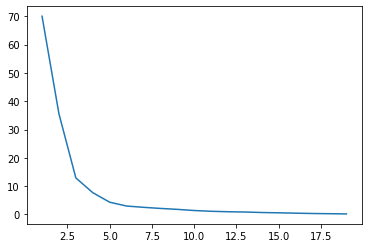

In [13]:
for_clustering=gdf[['Composite','Venue']].dropna()
scaler = StandardScaler()
clustering_std = scaler.fit_transform(for_clustering)

sse = []
list_k = list(range(1, 20))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(clustering_std)
    sse.append(km.inertia_)
    
ax = sns.lineplot(x=list_k, y=sse) # elbow looks between 2.5 and 5

In [14]:
# k=4 looks good

# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=1700).fit(clustering_std)

kmea = kmeans.labels_.astype(int)

# add clustering labels
gdf.insert(0, 'Cluster Labels', kmea)

## Results

Now, we'll map the results of our K-means analysis that sorted our neighborhoods into 4 clusters based on their composite bike/walk/transit scores and the number of Foursquare venues within their borders.

In [15]:
m3 = folium.Map(
    location=[38.897957,-77.036560],
    zoom_start=12
)

folium.GeoJson(
    urlneighs,
    name='geojson'
).add_to(m3)


folium.Choropleth(
    geo_data=gdf,
    name='choropleth',
    data=gdf,
    columns=['NEIGHBORHOOD', 'Cluster Labels'],
    key_on='feature.properties.NEIGHBORHOOD',
    fill_color='PuBuGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    bins=4,
    legend_name='Clusters'
).add_to(m3)

display(m3)

## Discussion

Let's explore each of the four clusters we just mapped in more depth so that we can report which neighborhoods are good for young professionals and why.

First up is Cluster 0. On the map, these neighborhoods are denoted with the light blue-white color, and they almost form a ring around the center city. As you can see in the table below, Cluster 0 includes neighborhoods with very high composite walk/bike/transit scores (80+) and mostly 20+ venues. Looks quite good for young professionals!

In [24]:
gdf_0=gdf[gdf['Cluster Labels'] == 0] 
gdf_0=gdf_0.drop(axis='columns',labels=["OBJECTID","Shape_Length","Shape_Area","TYPE",'Unnamed: 0',"Name"])
gdf_0

,Cluster Labels,NEIGHBORHOOD,geometry,Venue,Walk Score,Transit Score,Bike Score,Composite
2,0,"Dupont Circle, Connecticut Avenue/K Street","POLYGON ((-77.03455 38.91270, -77.03455 38.913...",69,98,89,95,94.000000
13,0,"Shaw, Logan Circle","POLYGON ((-77.03195 38.91410, -77.03333 38.914...",20,97,90,95,94.000000
8,0,"Union Station, Stanton Park, Kingman Park","POLYGON ((-76.98440 38.90032, -76.98472 38.900...",24,95,80,95,90.000000
12,0,"West End, Foggy Bottom, GWU","POLYGON ((-77.05011 38.90899, -77.05010 38.909...",21,95,91,80,88.666667
6,0,"Columbia Heights, Mt. Pleasant, Pleasant Plain...","POLYGON ((-77.03523 38.93743, -77.03570 38.937...",28,94,82,90,88.666667
24,0,"Kalorama Heights, Adams Morgan, Lanier Heights","POLYGON ((-77.04165 38.92720, -77.04187 38.927...",8,95,81,88,88.000000
15,0,"Howard University, Le Droit Park, Cardozo/Shaw","POLYGON ((-77.01389 38.92627, -77.01417 38.926...",18,93,81,89,87.666660
1,0,"Near Southeast, Navy Yard","POLYGON ((-76.98726 38.87712, -76.98860 38.877...",69,89,84,87,86.666667
4,0,"Capitol Hill, Lincoln Park","POLYGON ((-76.99496 38.89203, -76.99568 38.892...",39,86,81,92,86.333333
14,0,"Southwest Employment Area, Southwest/Waterfron...","POLYGON ((-77.02192 38.88757, -77.02742 38.887...",20,82,78,89,83.000000


Now, we'll take a look at Cluster 1. Cluster 1 is denoted by the grey-blue color on the map, and it includes all of the areas we analyzed that are east of the Anacostia River, as well as numerous neighborhoods close to the outer borders of DC. As you can see in the table below, neighborhoods in Cluster 1 generally have a low composite bike/walk/transit scores (less than 65). While some of the neighborhoods have a higher number of venues, most have 15 or fewer. 

These places do **not** seem good for young professionals. Notably, this not-so-good-for-YPs cluster includes both neighborhoods that are known for being quite ritzy, like Spring Valley - home to many media personalities, lawyers, politicans and other elies - as well as neighborhoods that are less affluent (though possibly gentrifying), like Deanwood, which was recently [profiled in the Washington Post](https://www.washingtonpost.com/realestate/deanwood-affordability-if-not-amenities-in-a-historic-area-of-dc/2019/11/27/ad5f5570-0edd-11ea-b0fc-62cc38411ebb_story.html) for its affordability, sense of community, and **lack** of grocery stores and amenities nearby.

In [25]:
gdf_1=gdf[gdf['Cluster Labels'] == 1]
gdf_1=gdf_1.drop(axis='columns',labels=["OBJECTID","Shape_Length","Shape_Area","TYPE",'Unnamed: 0',"Name"])
gdf_1 

,Cluster Labels,NEIGHBORHOOD,geometry,Venue,Walk Score,Transit Score,Bike Score,Composite
28,1,"River Terrace, Benning, Greenway, Dupont Park","POLYGON ((-76.93760 38.88996, -76.93783 38.890...",5,64,77,55,65.333333
29,1,"Lamont Riggs, Queens Chapel, Fort Totten, Plea...","POLYGON ((-76.99702 38.96167, -76.99841 38.962...",4,67,74,55,65.333333
27,1,"Mayfair, Hillbrook, Mahaning Heights","POLYGON ((-76.94755 38.90597, -76.94925 38.908...",5,48,72,67,62.333333
25,1,"North Cleveland Park, Forest Hills, Van Ness","POLYGON ((-77.05686 38.95482, -77.05689 38.954...",7,69,62,52,61.000000
10,1,"Cathedral Heights, McLean Gardens, Glover Park","POLYGON ((-77.07823 38.94222, -77.07952 38.942...",23,73,54,55,60.666667
16,1,"North Michigan Park, Michigan Park, University...","POLYGON ((-76.98629 38.95265, -76.98654 38.952...",17,51,67,57,58.333333
26,1,"Capitol View, Marshall Heights, Benning Heights","POLYGON ((-76.93920 38.89346, -76.94007 38.892...",6,61,68,44,57.666667
31,1,Historic Anacostia,"POLYGON ((-76.99004 38.86879, -76.99078 38.869...",3,61,67,44,57.333333
32,1,"Douglas, Shipley Terrace","POLYGON ((-76.97472 38.85287, -76.97499 38.853...",3,63,68,40,57.000000
34,1,"Deanwood, Burrville, Grant Park, Lincoln Heigh...","POLYGON ((-76.91322 38.88976, -76.91234 38.890...",1,50,69,52,57.000000


Cluster 2 consists of one neighborhood only (which, like many of the places we're considering here is really several small adjacent neighborhoods that the city aggregates for analysis purposes): Downtown, Chinatown, Penn Quarter, and Mount Vernon Square. This neighborhood, smack dab in the center of the city (and denoted in blue on the map) stands alone for its exceptional number of venues available to eat and drink at, as well as the highest composite walk/transit/bike score in the city. This is simply the best place for young professionals to hang out, according to our metrics. 

In [26]:
gdf_2=gdf[gdf['Cluster Labels'] == 2]
gdf_2=gdf_2.drop(axis='columns',labels=["OBJECTID","Shape_Length","Shape_Area","TYPE",'Unnamed: 0',"Name"])
gdf_2

,Cluster Labels,NEIGHBORHOOD,geometry,Venue,Walk Score,Transit Score,Bike Score,Composite
0,2,"Downtown, Chinatown, Penn Quarters, Mount Vern...","POLYGON ((-77.00906 38.90566, -77.00904 38.907...",191,93,100,92,95.0


Finally, we have Cluster 3, which is denoted in the dark teal green on the map. These are neighborhoods with medium-high composite walk/bike/transit scores (69-76). Within that, most have good walk scores and less good transit scores- Brightwood Park, Ivy City, and Georgetown are good examples of this phenomenon. These neighborhoods also boast relatively high numbers of venues, some quite high compared to most of the dataset - like Brookland, with 34 venues, and Georgetown, with 41. 

While these neighborhoods have flaws (namely low transit scores) that stop them from being **very** good for young professionals (like those neighborhoods in Cluster 0), they are much better suited for young professionals than the neighborhoods in Cluster 1, which have consistently lower composite walk/bike/transit scores and fewer places to eat and drink. The neighborhoods in Cluster 3 are not ideal, but they are completely viable places to hang out for young professionals.

In [27]:
gdf_3=gdf[gdf['Cluster Labels'] == 3]
gdf_3=gdf_3.drop(axis='columns',labels=["OBJECTID","Shape_Length","Shape_Area","TYPE",'Unnamed: 0',"Name"])
gdf_3 

,Cluster Labels,NEIGHBORHOOD,geometry,Venue,Walk Score,Transit Score,Bike Score,Composite
18,3,"Brightwood Park, Crestwood, Petworth","POLYGON ((-77.01670 38.94657, -77.01658 38.946...",17,83,68,76,76.000000
5,3,"Brookland, Brentwood, Langdon","POLYGON ((-76.97292 38.93259, -76.97341 38.933...",34,74,69,74,72.333333
19,3,"Cleveland Park, Woodley Park, Massachusetts Av...","POLYGON ((-77.06683 38.94008, -77.06697 38.940...",14,74,67,72,71.000000
9,3,"Friendship Heights, American University Park, ...","POLYGON ((-77.06893 38.94235, -77.06897 38.942...",24,79,64,68,70.333333
3,3,"Georgetown, Burleith/Hillandale","POLYGON ((-77.06518 38.91684, -77.06527 38.917...",41,79,61,71,70.333333
7,3,"Ivy City, Arboretum, Trinidad, Carver Langston","POLYGON ((-76.96972 38.91740, -76.97013 38.917...",26,82,59,68,69.666667
20,3,"Takoma, Brightwood, Manor Park","POLYGON ((-77.01418 38.97237, -77.01403 38.972...",13,77,66,65,69.333333


## Conclusion

All in all, my K-Means clustering analysis of neighborhoods in Washington, D.C. based on their composite walk/bike/transit scores and the number of venues to eat and drink according to Foursquare produced the following insights:

**BEST AREA FOR YOUNG PROFESSIONALS** (Cluster 2): Downtown, Chinatown, Penn Quarter, and Mount Vernon Square

***VERY* GOOD AREAS FOR YOUNG PROFESSIONALS** (Cluster 0): 
- Dupont Circle, Connecticut Avenue/K Street
- Shaw, Logan Circle
- Union Station, Stanton Park, Kingman Park
- West End, Foggy Bottom, GWU
- Columbia Heights, Mt. Pleasant, Pleasant Plains, Park View
- Kalorama Heights, Adams Morgan, Lanier Heights
- Howard University, Le Droit Park, Cardozo/Shaw
- Near Southeast, Navy Yard	
- Capitol Hill, Lincoln Park	
- Southwest Employment Area, Southwest/Waterfront, Fort McNair, Buzzard Point
- Edgewood, Bloomingdale, Truxton Circle, Eckington

**GOOD AREAS FOR YOUNG PROFESSIONALS** (Cluster 3):

- Brightwood Park, Crestwood, Petworth	
- Brookland, Brentwood, Langdon
- Cleveland Park, Woodley Park, Massachusetts Avenue Heights, Woodland-Normanstone Terrace
- Friendship Heights, American University Park, Tenleytown
- Georgetown, Burleith/Hillandale
- Ivy City, Arboretum, Trinidad, Carver Langston
- Takoma, Brightwood, Manor Park

**NOT-SO-GOOD AREAS FOR YOUNG PROFESSIONALS** (Cluster 1):

- River Terrace, Benning, Greenway, Dupont Park	
- Lamont Riggs, Queens Chapel, Fort Totten, Pleasant Hill
- Mayfair, Hillbrook, Mahaning Heights
- North Cleveland Park, Forest Hills, Van Ness
- Cathedral Heights, McLean Gardens, Glover Park
- North Michigan Park, Michigan Park, University Heights
- Capitol View, Marshall Heights, Benning Heights
- Historic Anacostia
- Douglas, Shipley Terrace
- Deanwood, Burrville, Grant Park, Lincoln Heights, Fairmont Heights
- Hawthorne, Barnaby Woods, Chevy Chase
- Congress Heights, Bellevue, Washington Highlands
- Twining, Fairlawn, Randle Highlands, Penn Branch, Fort Davis Park, Fort Dupont
- Woodridge, Fort Lincoln, Gateway
- Fairfax Village, Naylor Gardens, Hillcrest, Summit Park
- Spring Valley, Palisades, Wesley Heights, Foxhall Crescent, Foxhall Village, Georgetown Reservoir